In [1]:
import json
import re
import os
from pathlib import Path

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import torch
import torchvision.transforms.functional as TF
from einops import rearrange

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.dpi'] = 300

In [5]:
import mushroom.utils as utils
from mushroom.registration import read_bigwarp_warp_field, register_adata, register_codex
from mushroom.dataloaders import incorporate_hi_res

In [6]:
run_dir = '/data/estorrs/mushroom/data/test_registration/HT448C1/'
out_dir = os.path.join(run_dir, 'registered')
Path(out_dir).mkdir(parents=True, exist_ok=True)

In [7]:
metadata = json.load(open(os.path.join(run_dir, 'slices_unregistered', 'metadata.json')))
metadata

{'downsample_scaler': 0.1,
 'phenocycler_pixels_per_micron': 1.9604911906033102,
 'order': ['HT448C1-Th1K1Fp1U1',
  'HT448C1-Th1K1Fp1U2',
  'HT448C1-Th1K1Fp1U13',
  'HT448C1-Th1K1Fp1U14']}

In [8]:
slice_to_sid = {f's{i}':sid for i, sid in enumerate(metadata['order'])}
sid_to_slice = {v:k for k, v in slice_to_sid.items()}
slice_to_sid

{'s0': 'HT448C1-Th1K1Fp1U1',
 's1': 'HT448C1-Th1K1Fp1U2',
 's2': 'HT448C1-Th1K1Fp1U13',
 's3': 'HT448C1-Th1K1Fp1U14'}

In [9]:
fps = sorted(utils.listfiles(os.path.join(run_dir, 'ddfs'),
                             regex=r'/s[0-9]+.*$'))
fps

['/data/estorrs/mushroom/data/test_registration/HT448C1/ddfs/s1.tif',
 '/data/estorrs/mushroom/data/test_registration/HT448C1/ddfs/s2.tif',
 '/data/estorrs/mushroom/data/test_registration/HT448C1/ddfs/s3.tif']

In [10]:
slice_to_ddf = {fp.split('/')[-1].split('.')[0]:read_bigwarp_warp_field(
    fp, metadata['downsample_scaler']) for fp in fps}
slice_to_ddf.keys()

dict_keys(['s1', 's2', 's3'])

## spatial transcriptomics

In [15]:
sid_to_adata = {
    'HT448C1-Th1K1Fp1U1': '/data/spatial_transcriptomics/spaceranger_outputs/colorectal/HT448C1-Th1K1Fp1U1Bp1',
    'HT448C1-Th1K1Fp1U13': '/data/spatial_transcriptomics/spaceranger_outputs/colorectal/HT448C1-Th1K1Fp1U13Bp1',
}

fps = {
    'HT448C1-Th1K1Fp1U1':  '/data/spatial_transcriptomics/highres_images/colorectal/C1_HT448C1-Th1K1Fp1U1.tif',
    'HT448C1-Th1K1Fp1U13': '/data/spatial_transcriptomics/highres_images/colorectal/D1_HT448C1-Th1K1Fp1U13.tif',
}


sid_to_he = {sid:fp for sid, fp in fps.items()}
sid_to_he.keys()

dict_keys(['HT448C1-Th1K1Fp1U1', 'HT448C1-Th1K1Fp1U13'])

In [18]:
sid_to_registered_adata = {}
for sid, fp in sid_to_adata.items():
    slice_id = sid_to_slice[sid]
    print(slice_id, sid)
    
    a = utils.adata_from_visium(fp)
    he = rearrange(torch.tensor(tifffile.imread(sid_to_he[sid])), 'h w c -> c h w')
    
    if slice_id in slice_to_ddf:
        ddf = slice_to_ddf[slice_id]
    else:
        ddf = torch.zeros_like(next(iter(slice_to_ddf.values())))

    registered = register_adata(he, a, ddf)
    sid_to_registered_adata[sid] = registered
        

s0 HT448C1-Th1K1Fp1U1


/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


s2 HT448C1-Th1K1Fp1U13


/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [19]:
for sid, a in sid_to_registered_adata.items():
    slice_id = sid_to_slice[sid]
    a.write_h5ad(os.path.join(out_dir, f'{slice_id}.h5ad'))

## codex

In [20]:
sid_to_fp = {
    'HT448C1-Th1K1Fp1U2': '/data/multiplex_imaging/codex/htan/crc/HT488C1-Th1K1Fp1-U2_041323.ome.tiff',
    'HT448C1-Th1K1Fp1U14': '/data/multiplex_imaging/codex/htan/crc/HT488C1-Th1K1Fp1-U14_041823.ome.tiff',
}
sid_to_fp.keys()

dict_keys(['HT448C1-Th1K1Fp1U2', 'HT448C1-Th1K1Fp1U14'])

In [21]:
for sid, fp in sid_to_fp.items():
    slice_id = sid_to_slice[sid]
    print(slice_id, sid)
    
    channel_to_img = utils.extract_ome_tiff(fp)
    
    if slice_id in slice_to_ddf:
        ddf = slice_to_ddf[slice_id]
    else:
        ddf = torch.zeros_like(next(iter(slice_to_ddf.values())))

    warped_channel_to_img = register_codex(channel_to_img, ddf)
    utils.save_ome_tiff(warped_channel_to_img, os.path.join(out_dir, f'{slice_id}.ome.tiff'))

s1 HT448C1-Th1K1Fp1U2


/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/ome_types/_convenience.py:106: FutureWarning: The default XML parser will be changing from 'xmlschema' to 'lxml' in version 0.4.0.  To silence this warning, please provide the `parser` argument, specifying either 'lxml' (to opt into the new behavior), or'xmlschema' (to retain the old behavior).
  d = to_dict(os.fspath(xml), parser=parser, validate=validate)


s3 HT448C1-Th1K1Fp1U14


## metadata

In [22]:
def get_dtype(sid):
    if sid in sid_to_adata:
        return 'visium'
    return 'codex'
    

metadata['data_type'] = [get_dtype(sid) for sid in metadata['order']]

In [23]:
metadata['slices'] = [sid_to_slice[sid] for sid in metadata['order']]

In [24]:
json.dump(metadata, open(os.path.join(out_dir, 'metadata.json'), 'w'))

## visualize

In [25]:
fps = sorted(utils.listfiles(out_dir, regex=r'/s[0-9]+\..*$'))
fps

['/data/estorrs/mushroom/data/test_registration/HT448C1/registered/s0.h5ad',
 '/data/estorrs/mushroom/data/test_registration/HT448C1/registered/s1.ome.tiff',
 '/data/estorrs/mushroom/data/test_registration/HT448C1/registered/s2.h5ad',
 '/data/estorrs/mushroom/data/test_registration/HT448C1/registered/s3.ome.tiff']

In [26]:
cmap = {
    'DAPI': (0., 0., 1.),
    'Pan-Cytokeratin': (1., 0., 0.),
    'CD45 (D)': (0., 1., 0.),
    'SMA-(D)': (1., 1., 1.)
}

slice_to_pseudo = {}
for fp in fps:
    if 'ome.tiff' in fp:
        sid = re.sub(r'^(s[0-9]+).*$', r'\1', fp.split('/')[-1])
        print(sid)
        d = utils.extract_ome_tiff(fp, channels=list(cmap.keys()))
        pseudo = utils.make_pseudo(d, cmap=cmap, contrast_pct=90.)
        pseudo = utils.flexible_rescale(pseudo, scale=.1)
        slice_to_pseudo[sid] = pseudo

s1
s3


In [27]:
slice_to_adata = {}
for fp in fps:
    if '.h5ad' in fp:
        sid = re.sub(r'^(s[0-9]+).*$', r'\1', fp.split('/')[-1])
        print(sid)
        a = sc.read_h5ad(fp)
        slice_to_adata[sid] = a

s0
s2


In [28]:
a = next(iter(slice_to_adata.values()))
a

AnnData object with n_obs × n_vars = 1493 × 17943
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'he_rescaled', 'he_rescaled_warped', 'spatial'
    obsm: 'he_rescaled_spatial', 'spatial', 'spatial_original'

s0


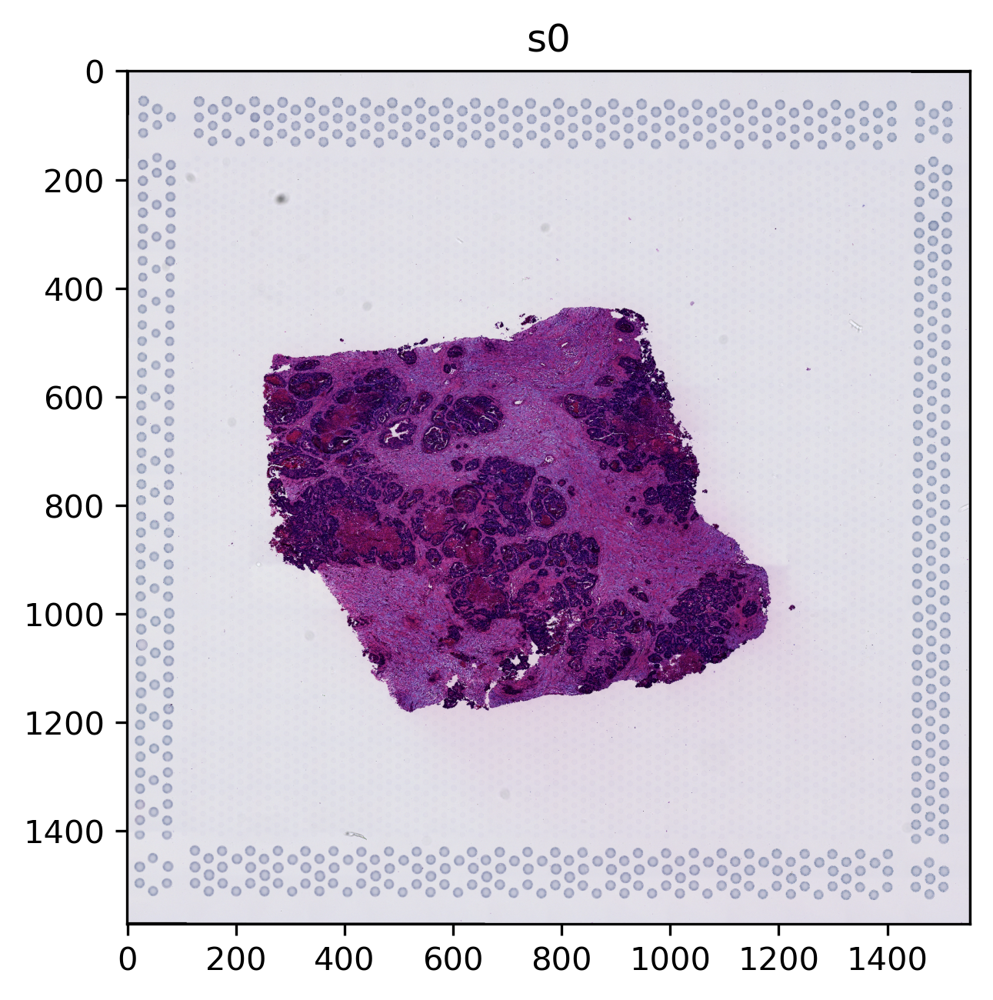

s1


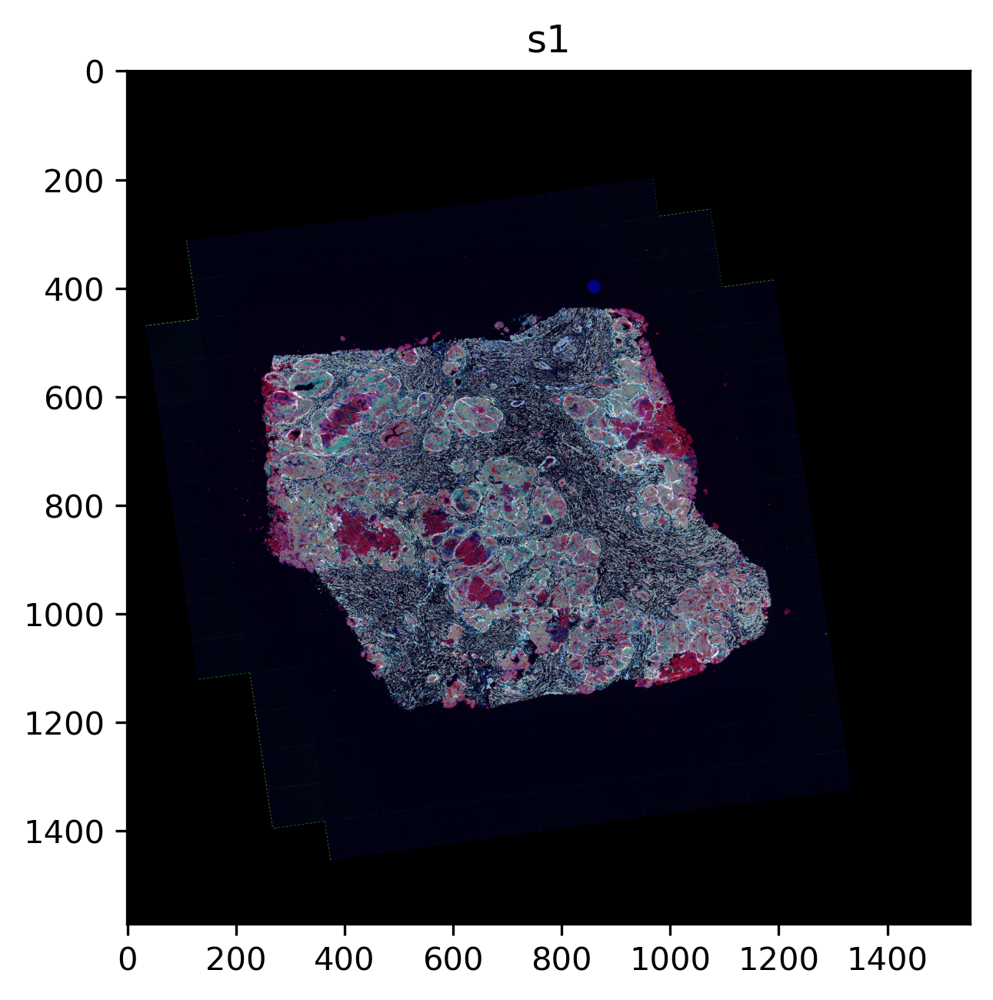

s2


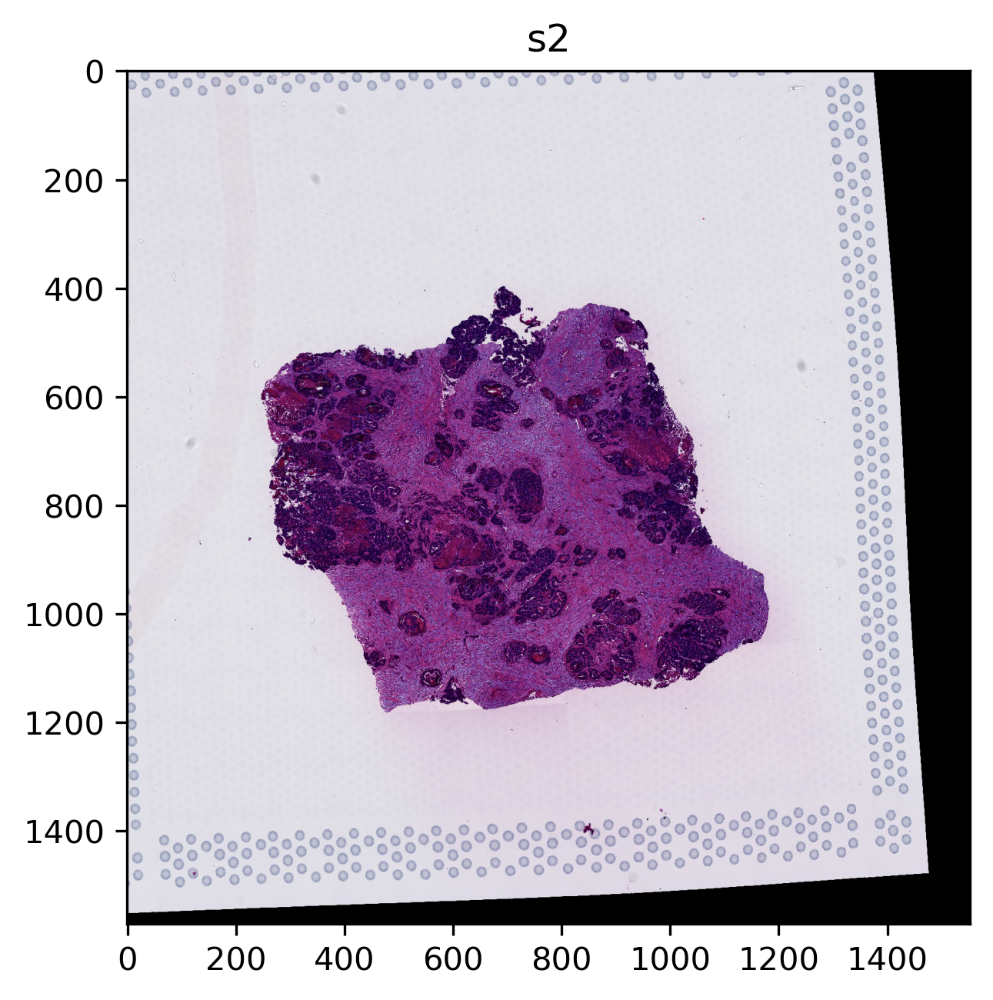

s3


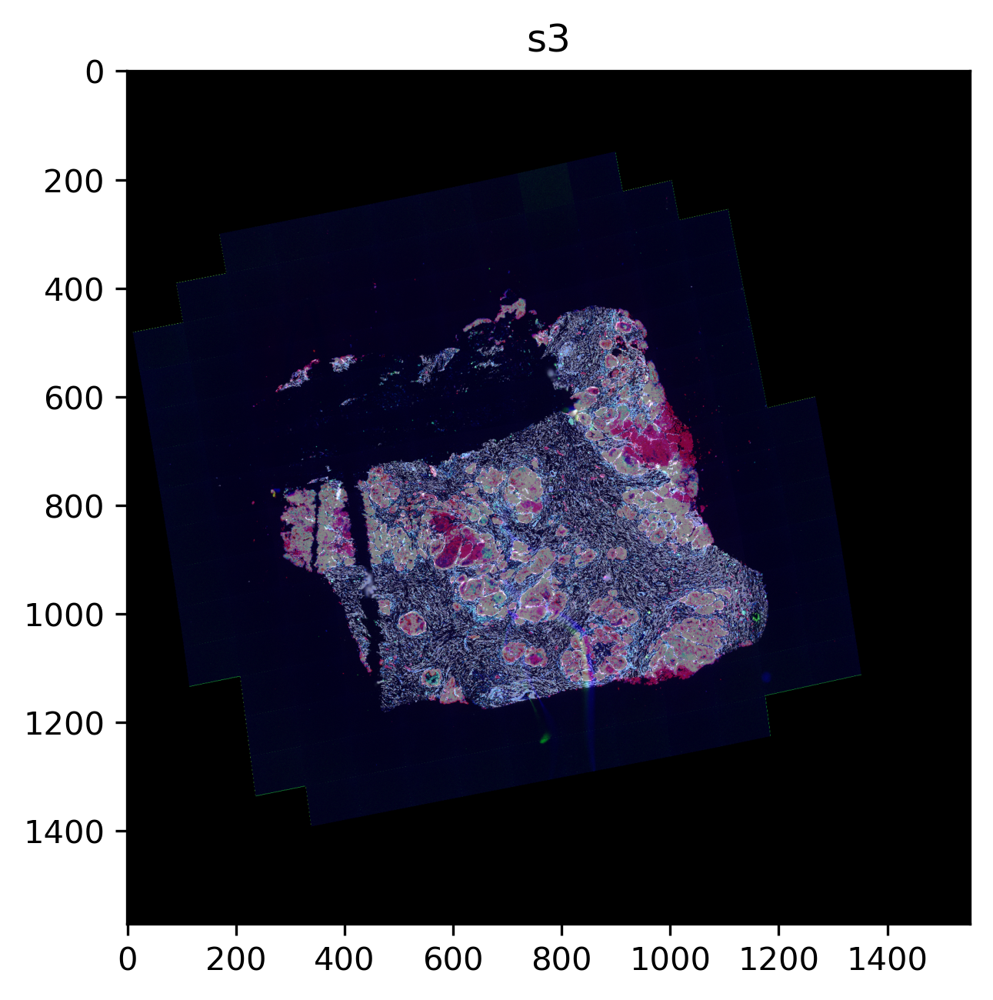

In [29]:
for s in metadata['slices']:
    print(s)
    if s in slice_to_adata:
#         sc.pl.spatial(slice_to_adata[s])
        img = slice_to_adata[s].uns['he_rescaled_warped']
        plt.imshow(utils.flexible_rescale(img, scale=.1))
        plt.title(s)
        plt.show()
    elif s in slice_to_pseudo:
        plt.imshow(slice_to_pseudo[s])
        plt.title(s)
        plt.show()

s0


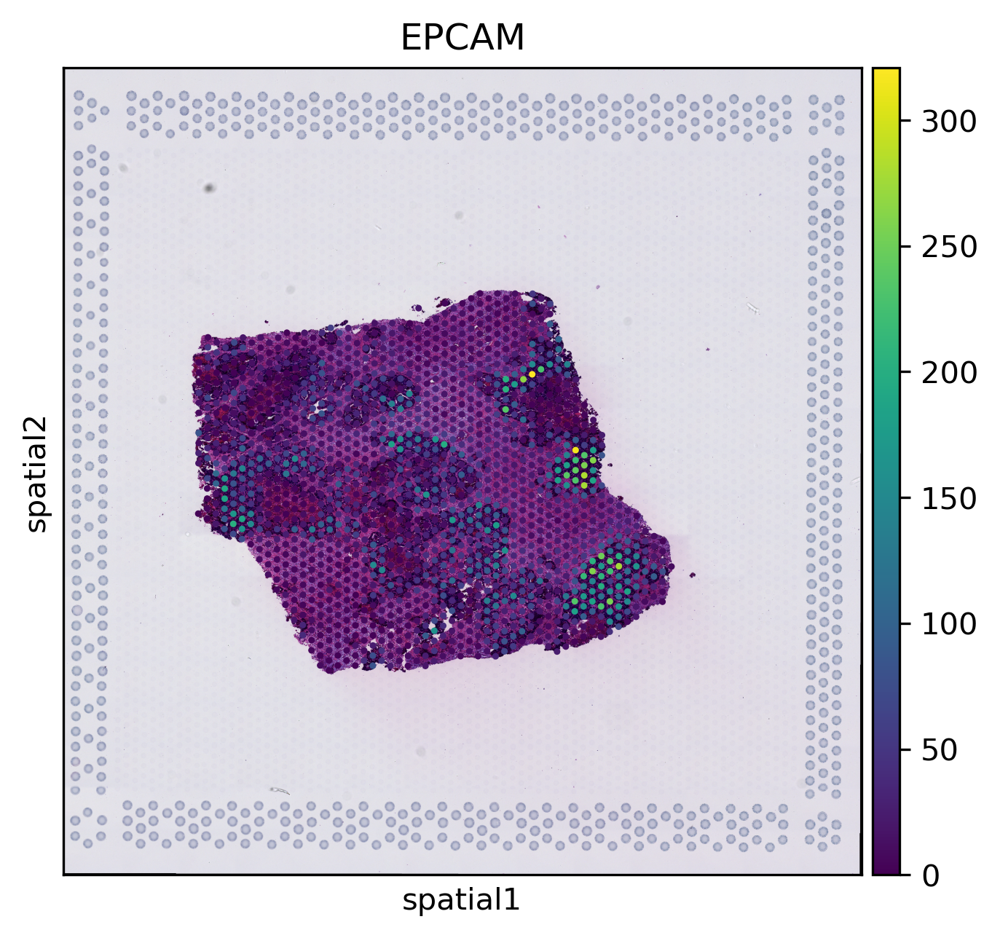

s1


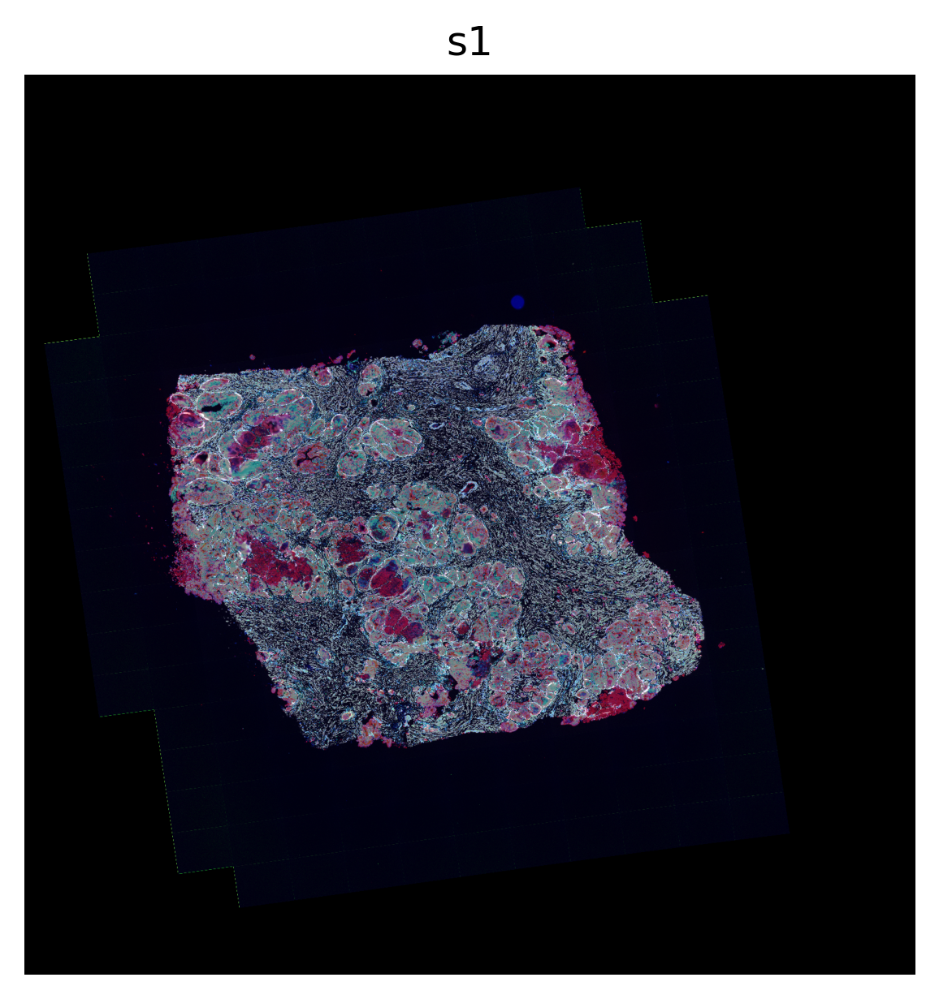

s2


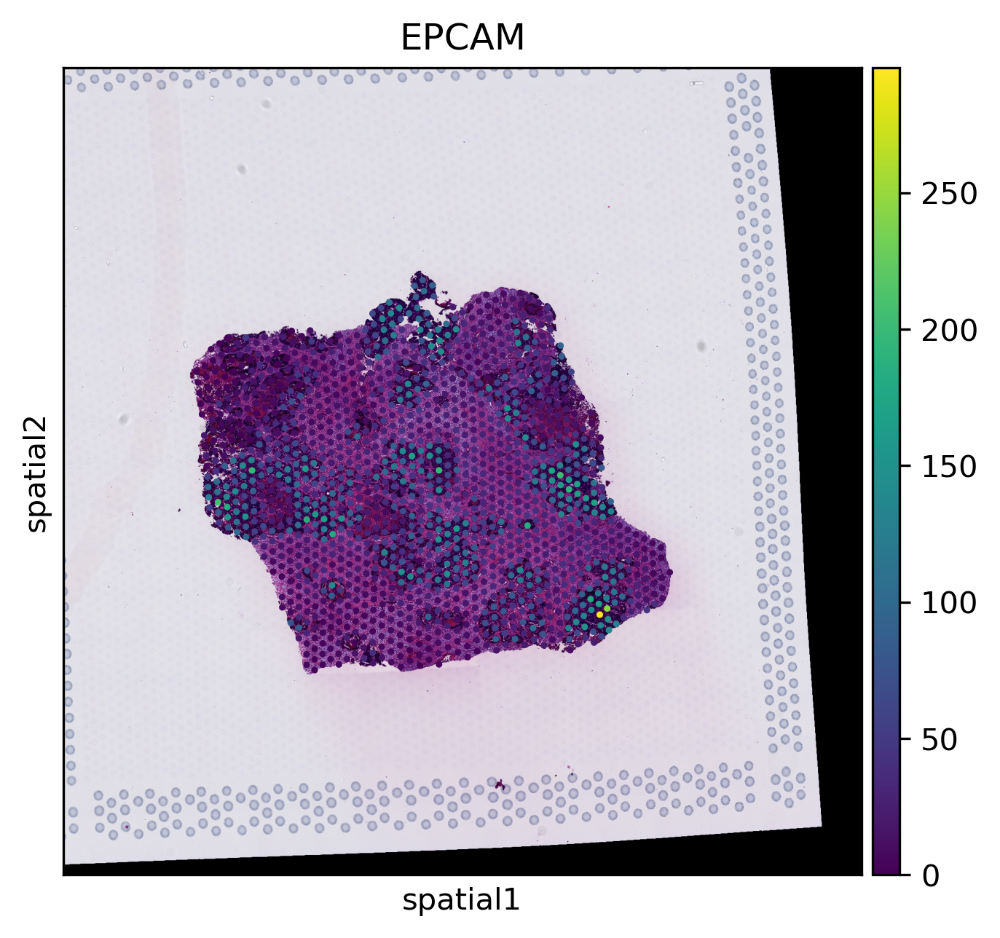

s3


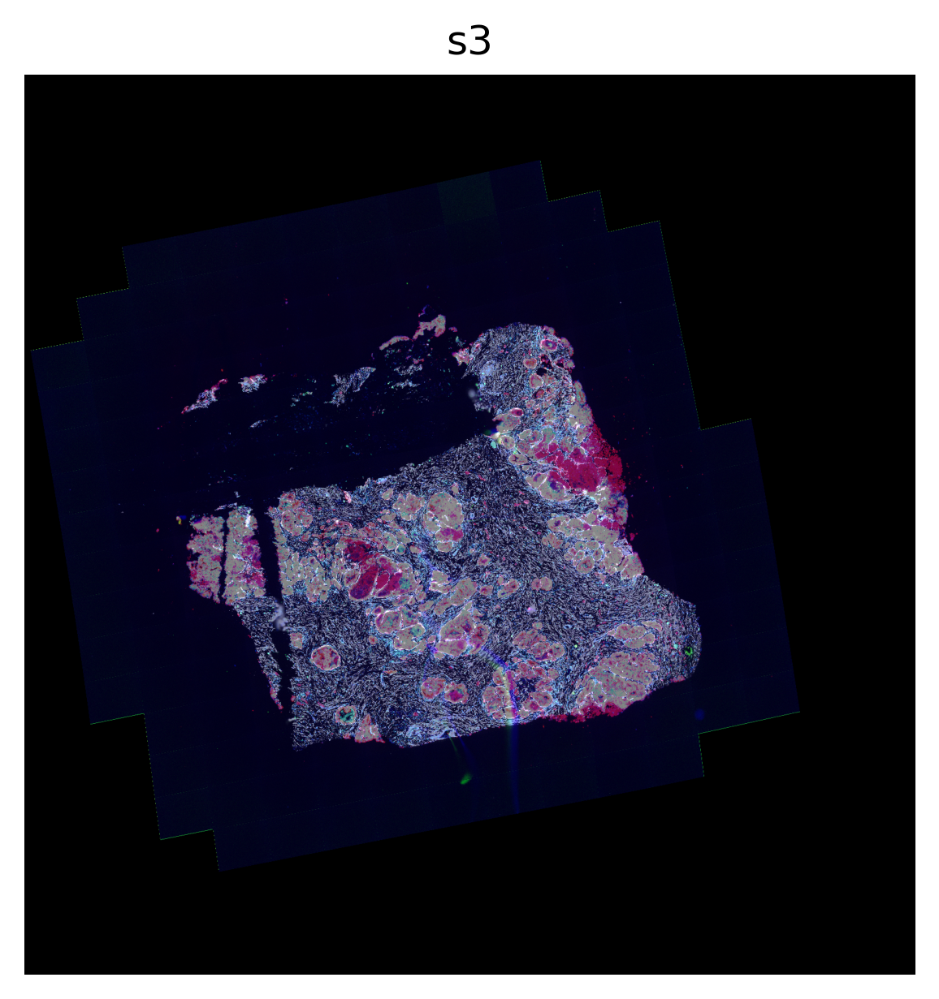

In [30]:
for s in metadata['slices']:
    print(s)
    if s in slice_to_adata:
        fig, ax = plt.subplots()
        shape = slice_to_adata[s].uns['he_rescaled_warped'].shape
        sc.pl.spatial(slice_to_adata[s], color='EPCAM', ax=ax, crop_coord=(0, shape[1], 0, shape[0]))
        ax.set_title(s)
        plt.show()
    elif s in slice_to_pseudo:
        plt.imshow(slice_to_pseudo[s])
        plt.title(s)
        plt.axis('off')
        plt.show()

In [39]:
def make_serial_figure(metadata, gene=None, colorbar_loc=None):
    fig, axs = plt.subplots(nrows=1, ncols=len(metadata['slices']))
    for i, s in enumerate(metadata['slices']):
        print(s)
        ax = axs[i]
        if s in slice_to_adata:
            shape = slice_to_adata[s].uns['he_rescaled_warped'].shape
            sc.pl.spatial(slice_to_adata[s], color=gene, ax=ax, crop_coord=(0, shape[1], 0, shape[0]),
                          show=False, colorbar_loc=colorbar_loc)
            ax.set_title(s)
            ax.axis('off')
        elif s in slice_to_pseudo:
            ax.imshow(slice_to_pseudo[s])
            ax.set_title(s)
            ax.axis('off')

In [34]:
out_dir = os.path.join(run_dir, 'figures')
Path(out_dir).mkdir(parents=True, exist_ok=True)

s0
s1
s2
s3


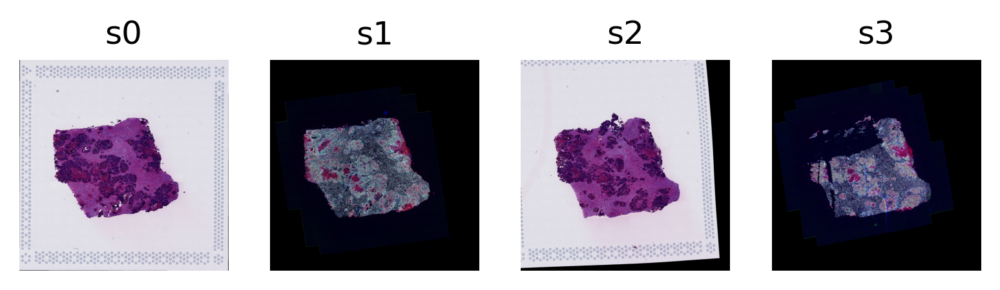

In [35]:
make_serial_figure(metadata, gene=None)
plt.savefig(os.path.join(out_dir, 'aligned.pdf'))

s0
s1
s2
s3


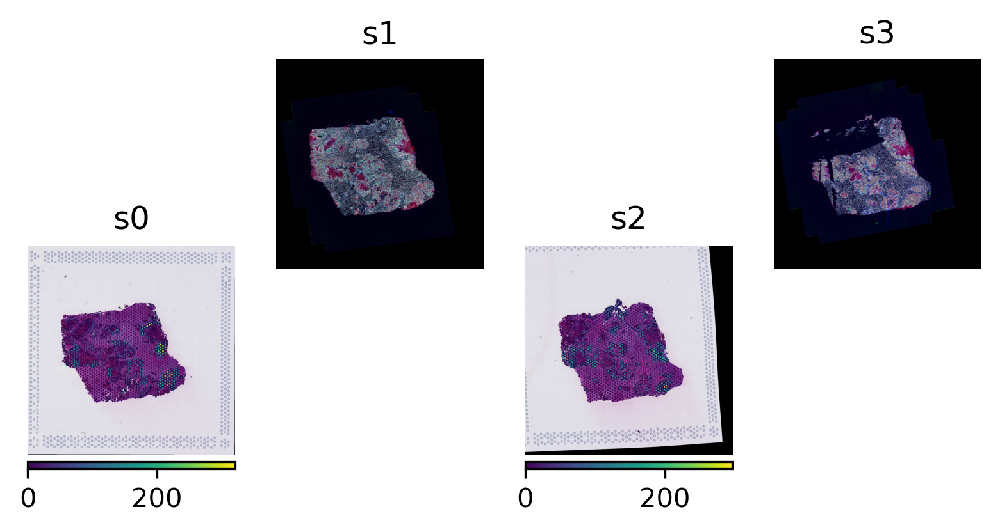

In [42]:
make_serial_figure(metadata, gene='EPCAM', colorbar_loc='bottom')
plt.savefig(os.path.join(out_dir, 'aligned_epcam.pdf'))